# __Data-X Project: Electricity Price Prediction__
## Feature Modeling Group: Machine Learning Optimization Pipeline

### Originally conceived and implemented 'Hopping Lasso' algorithm:
#### Training independent regression models for every discrete future prediction on ranges of past data that are transformed into active features. All signals are subjected to nonlinear functions and combinations, then filtered based on Pearson correlation with each other and with the forecast variable of interest. Created by Eric Yehl.


Retail electricity prices across different regions will have varying dependencies on all kinds of other signals in the energy marketplace. This notebook is an "pipeline" that integrates any available regional data (as well as national data) into an automated feature selection and machine learning model routine. 

Team Members: Aaron Drew, Arbaaz Shakir, John Stuart, Adam Yankelevits, Eric Yehl

**Note:** In order to render all graphics, this notebook needs to be launched by typing: 
jupyter lab Project.ipynb --NotebookApp.iopub_data_rate_limit=10000000000
or by changing this limit in your jupyter configuration file.

This notebook relies on a background script called 'helper_functions.py'. The file contains a lot of utility functions used thorughout the notebook, to reduce code clutter in the notebook.

## Import Libraries

Import open source packages and files defining custom functions.

In [2]:
%run helper_functions.py 

## Data Aggregation

### Stitch many data streams into a Google Sheet and create a pandas dataframe by importing from Sheets API.

Columns: features

Rows: monthly data

In [4]:
%run helper_functions.py 
raw_all_data = flip_df(import_sheet('TOY DATA 2'))

### Alternatively, use a csv file

In [ ]:
# csv_filename = ''
# raw_all_data = flip_df(pd.read_csv(csv_filename))

In [174]:
raw_all_data.head()

,AllFuelsGen,AvgRetailPrice,BiofuelsCons,BiomassCons,CoalGen,CommElecNetGen,CommNatGasCons,CommNatGasPrice,CommPrice,DirectElecUse,...,TotCoalCons,TotElecNetGen,TotIndNatGasCons,TotIndOtherNatGasCons,TotNatGasCons,TotRetailElecSales,TotTransNatGasCons,WasteCons,WindCons,WoodCons
0,20980.32,11.02,197.74,408.80,23.13,1.10,134.48,8.90,11.00,12.23,...,48.02,400.02,760.38,623.95,2111.26,24342.40,57.27,40.35,146.41,170.71
1,18260.49,10.87,198.38,401.25,26.83,1.05,139.02,8.76,10.99,11.56,...,55.52,355.77,741.75,611.05,1890.42,22235.31,51.53,39.32,181.06,163.55
2,16878.56,10.37,199.78,403.03,14.41,1.01,179.21,8.32,10.58,11.15,...,39.54,321.20,758.14,624.51,1886.70,19838.08,51.55,41.20,208.06,162.05
3,15436.07,10.10,182.92,382.85,19.34,0.90,213.26,8.09,10.40,10.91,...,43.50,293.68,754.27,625.27,1914.40,17875.54,52.14,41.61,236.73,158.32
4,16101.85,10.34,190.12,404.14,27.06,1.05,373.14,7.68,10.48,11.50,...,55.85,317.93,824.20,691.12,2513.84,19947.98,67.47,45.03,238.56,168.99


In [ ]:
# raw_toy_data = import_sheet('TOY DATA')

## Exploratory Data Analysis

### Raw signal plot

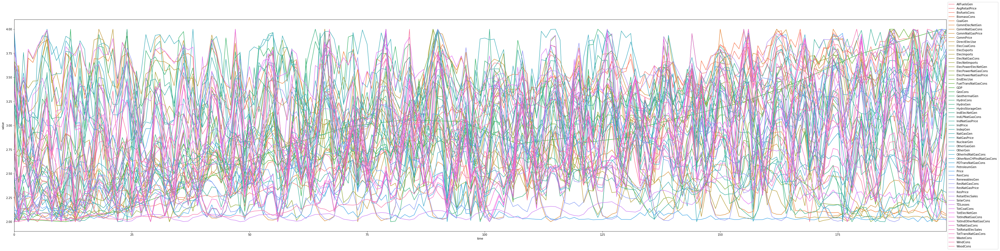

In [3]:
plt.close("all")
%run helper_functions.py 
signal_plot(flip_df(raw_all_data))

### Pearson correlation matrix "heat map" for colinearity between all features

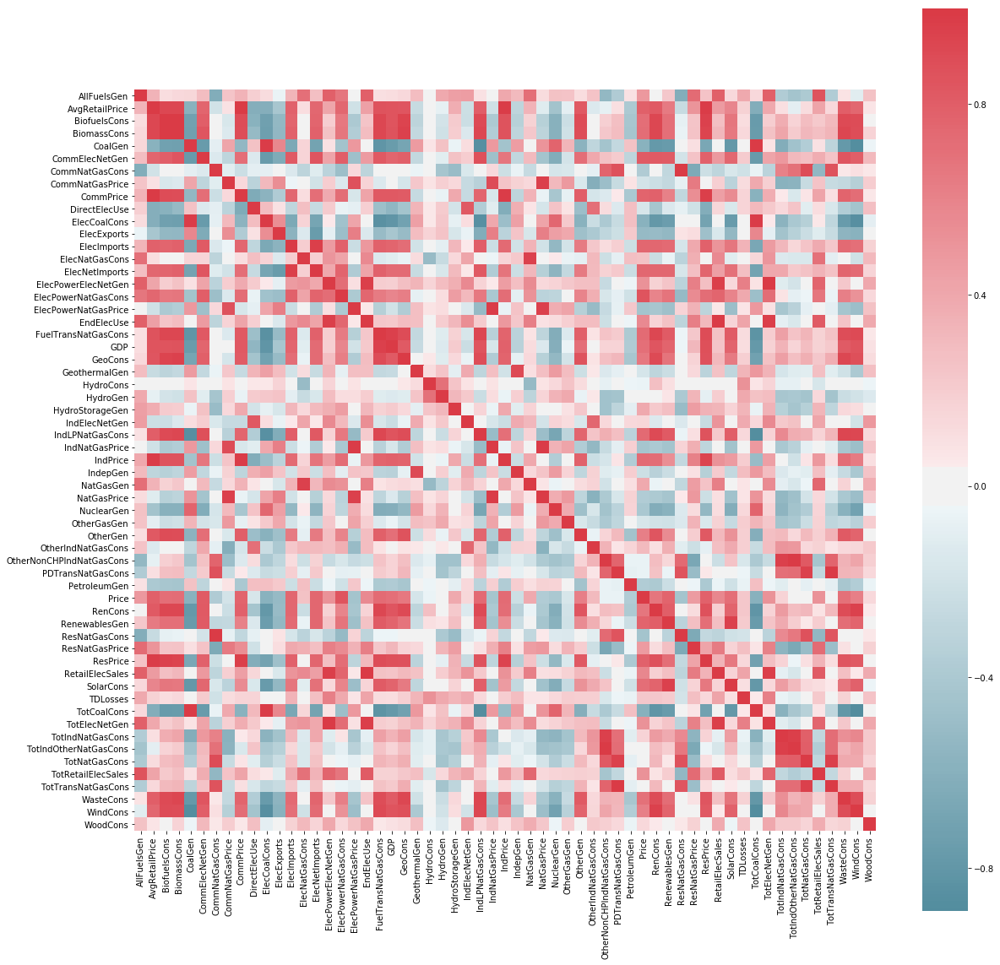

In [4]:
plt.close("all")
%run helper_functions.py
reg_heat_map(raw_all_data)

### Time displaced Pearson correlations of all features with price.

Shows that some signals are highly correlated with price when using some seasonal offset.

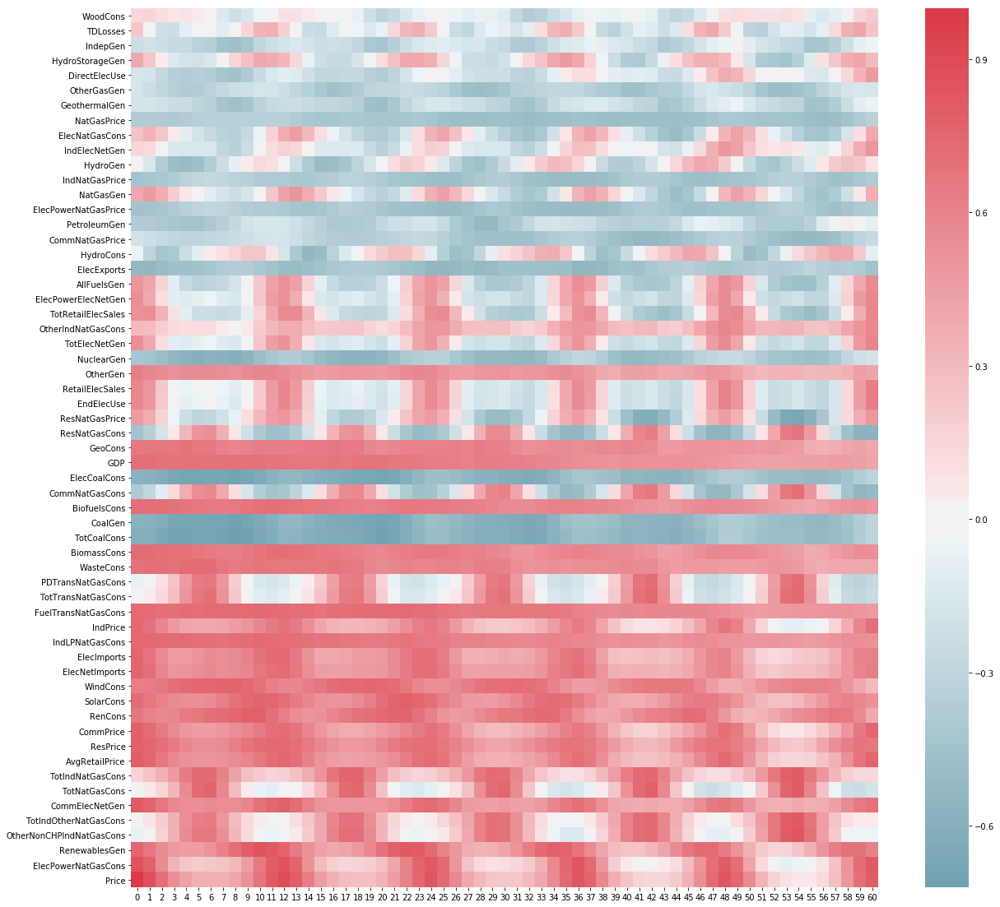

In [163]:
plt.close("all")
%run helper_functions.py 
time_heat_map(raw_all_data, months=60, sort='range')

## Data Transformation

Standardize signals. Split data into a past to train on and a future to compare to.

In [175]:
%run helper_functions.py

pred_len = 64 # predict this many months
start_back = 36 # Start predicting this many months back from the latest data
cut_oldest = 36 # Remove this many months of oldest data
raw_test_data = raw_all_data.iloc[start_back:len(raw_all_data)-cut_oldest]
raw_test_data.head()

,AllFuelsGen,AvgRetailPrice,BiofuelsCons,BiomassCons,CoalGen,CommElecNetGen,CommNatGasCons,CommNatGasPrice,CommPrice,DirectElecUse,...,TotCoalCons,TotElecNetGen,TotIndNatGasCons,TotIndOtherNatGasCons,TotNatGasCons,TotRetailElecSales,TotTransNatGasCons,WasteCons,WindCons,WoodCons
36,20038.76,11.03,179.72,417.88,118.95,1.17,137.61,10.06,11.17,12.36,...,102.35,385.78,735.46,605.05,1881.02,25635.58,51.87,44.99,115.90,193.17
37,16859.79,10.75,173.17,402.82,117.59,1.04,141.45,9.94,10.96,11.38,...,98.46,357.84,709.38,585.81,1745.35,22629.66,48.17,42.41,150.25,187.24
38,16423.10,10.21,176.16,401.95,48.01,0.99,176.75,9.70,10.54,11.20,...,61.83,324.72,733.10,606.07,1810.22,20712.61,49.98,43.13,148.37,182.66
39,15121.18,10.00,167.44,391.17,53.34,0.93,251.04,9.49,10.46,10.78,...,58.12,297.63,751.39,627.79,1961.68,19847.01,54.21,43.90,177.22,179.83
40,14120.89,10.28,167.35,402.12,82.02,0.97,420.93,9.35,10.65,11.42,...,86.53,331.82,805.31,680.63,2557.89,18994.26,70.92,44.53,168.67,190.24


In [106]:
%run helper_functions.py

std_all_data, all_rescaler = standardize(raw_all_data, feature_range=[2,4], comp_var='Price')
std_test_data, test_rescaler1 = standardize(raw_test_data, feature_range=[2,4], comp_var='Price')
std_all_data.head()

,AllFuelsGen,AvgRetailPrice,BiofuelsCons,BiomassCons,CoalGen,CommElecNetGen,CommNatGasCons,CommNatGasPrice,CommPrice,DirectElecUse,...,TotCoalCons,TotElecNetGen,TotIndNatGasCons,TotIndOtherNatGasCons,TotNatGasCons,TotRetailElecSales,TotTransNatGasCons,WasteCons,WindCons,WoodCons
0,3.403972,3.995327,3.932231,3.888799,2.077525,3.621622,2.063336,2.559829,3.913265,2.973451,...,2.173665,3.696911,3.312759,3.202027,2.809354,3.398367,2.673360,3.344933,3.214207,2.949232
1,2.963882,3.925234,3.939061,3.820707,2.110420,3.486486,2.083444,2.529915,3.908163,2.736283,...,2.286143,3.081130,3.190298,3.107959,2.568756,2.999104,2.481258,3.239509,3.509679,2.643771
2,2.740275,3.691589,3.954002,3.836760,2.000000,3.378378,2.261449,2.435897,3.698980,2.591150,...,2.046491,2.600056,3.298035,3.206111,2.564703,2.544863,2.481928,3.431934,3.739916,2.579778
3,2.506868,3.565421,3.774066,3.654762,2.043830,3.081081,2.412260,2.386752,3.607143,2.506195,...,2.105879,2.217089,3.272596,3.211653,2.594882,2.172989,2.501673,3.473900,3.984395,2.420648
4,2.614597,3.677570,3.850907,3.846771,2.112464,3.486486,3.120383,2.299145,3.647959,2.715044,...,2.291092,2.554551,3.732268,3.691837,3.247952,2.565687,3.014726,3.823951,4.000000,2.875853


## Feature Construction

Create new features using derivatives (perhaps first interpolating with polynomials, then taking the derivative(s) of these instead of using finite difference), powers, time offsets, and perhaps products and quotients of these. Do this intelligently so as not to create an intractable amount of combinations.

### Remove repeated features

In [107]:
%run helper_functions.py 
new_test_data0 = keep_distinct_features(std_test_data, 
                                        corr_cut=1, 
                                        look_back=0)

4 features thrown out due to correlation with other features. 0 NaNs resulted from Pearson calculations
54 total features remaining


### Remove features very poorly correlated with price

In [108]:
%run helper_functions.py 
new_test_data1 = trim_features(new_test_data0, 
                               corr_cut=0, 
                               look_back=7)

0 features thrown out due to poor correlation with price at all month offsets from 0 to 7
54 total features remaining


### Construct new features with functions. Remove poorly correlated features along the way

In [109]:
%run helper_functions.py 
new_test_data2 = new_features_with_funcs(new_test_data1,
                                   [cumtrapz_ext, diff_ext, np.log, np.sqrt, np.square, np.exp, series_ma],
                                   ['Int', 'Diff', 'Log', 'Sqrt', 'Square', 'Exp', 'MA'],
#                                    [np.log, np.sqrt, np.square, np.exp],
#                                    ['Log', 'Sqrt', 'Square', 'Exp'],
                                   filter=True,
                                   corr_cut=0.65,
                                   look_back=7,
                                   exclude_comp_var=False)

77 net new features created with functions. 308 new features were thrown out due to poor correlation with price at all month offsets from 0 to 7
131 total features remaining


### Create new features with combinations of features. Remove poorly correlated features along the way

In [110]:
%run helper_functions.py 
new_test_data3 = new_features_with_combs(new_test_data2, 
                                         combiners=['*','/','+','-'],
                                         n_combiners=5,
                                         filter=True, 
                                         corr_cut=0.87, 
                                         look_back=7,
                                         exclude_comp_var=False)

1846 net new features created with combinations. 41384 new features were thrown out due to poor correlation with Price                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                     
1977 total features remaining


### Remove features highly correlated with one another

In [117]:
%run helper_functions.py 
new_test_data4 = keep_distinct_features(new_test_data3, 
                                        corr_cut=.9, 
                                        look_back=0)

1911 features thrown out due to correlation with other features. 0 NaNs resulted from Pearson calculations                          
66 total features remaining


### Remove features poorly correlated with price

In [118]:
%run helper_functions.py 
new_test_data5 = trim_features(new_test_data4, corr_cut=.87, look_back=48)
new_test_data = new_test_data5

35 features thrown out due to poor correlation with price at all month offsets from 0 to 48
31 total features remaining


### Repeat Feature Construction Steps

In [120]:
# %run helper_functions.py 
# new_test_data6 = new_features_with_funcs(new_test_data5,\
#                                    [cumtrapz_ext, diff_ext, np.log, np.sqrt, np.square, np.exp],\
#                                    ['Int', 'Diff', 'Log', 'Sqrt', 'Square', 'Exp'],\
#                                    filter=True,\
#                                    corr_cut=0.95,\
#                                    look_back=7)
# new_test_data7 = new_features_with_combs(new_test_data6, combiners=['*','/'], filter=True, corr_cut=0.85, look_back=7)
# new_test_data8 = keep_distinct_features(new_test_data7, corr_cut=.9, look_back=7)
# new_test_data9 = trim_features(new_test_data8, corr_cut=.85, look_back=48)
# new_test_data = new_test_data9

### PCA Reduction of Features (if there are many)

In [18]:
# from sklearn.decomposition import PCA
# pca = PCA(n_components=10)
# new_vals = pca.fit_transform(new_test_data4.drop('Price',axis=1).replace([np.inf, -np.inf], np.nan).dropna(1).values)
# new_test_data_PCA = pd.DataFrame(data=new_vals, columns = [str(i) for i in range(10)])
# new_test_data_PCA = pd.concat([new_test_data2.Price, new_test_data_PCA], axis=1)
# new_test_data_PCA 

## New Correlation Matrices

Pearson correlation matrix "heat map" for colinearity between all features (old and new).

Time displaced correlation matrix "heat map" for colinearity between all features (old and new) and electricity price at offset times.

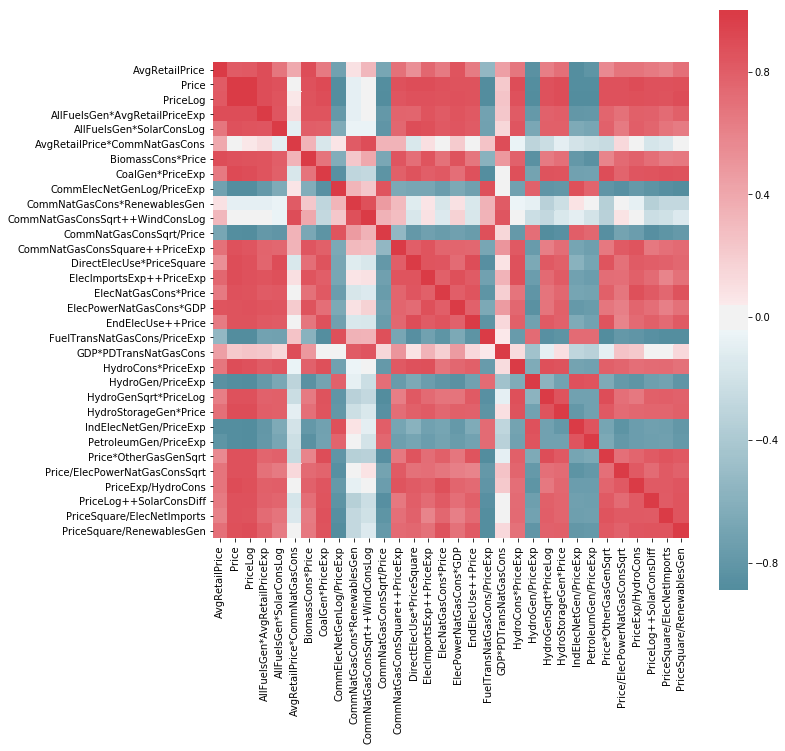

In [121]:
plt.close("all")
%run helper_functions.py 
plot = reg_heat_map(new_test_data)

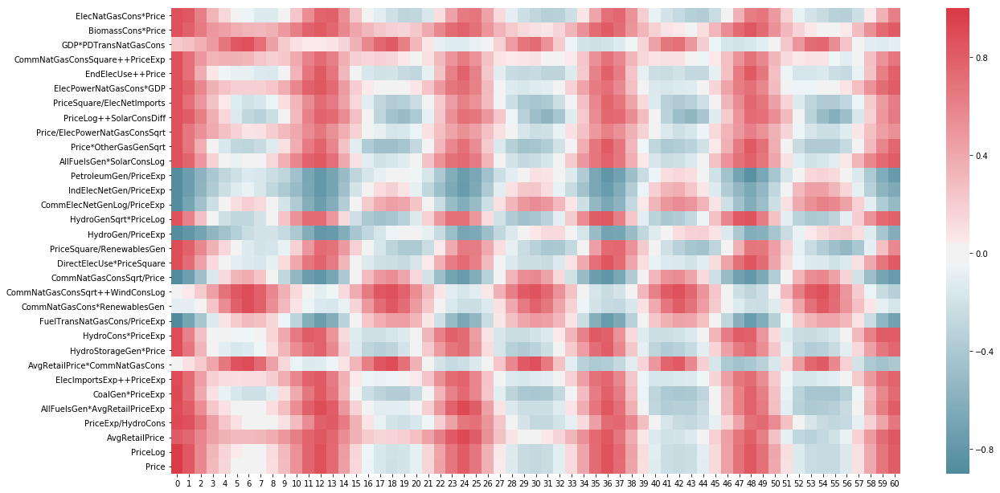

In [122]:
plt.close("all")
%run helper_functions.py 
time_heatmap = time_heat_map(new_test_data,months=60,sort='range')

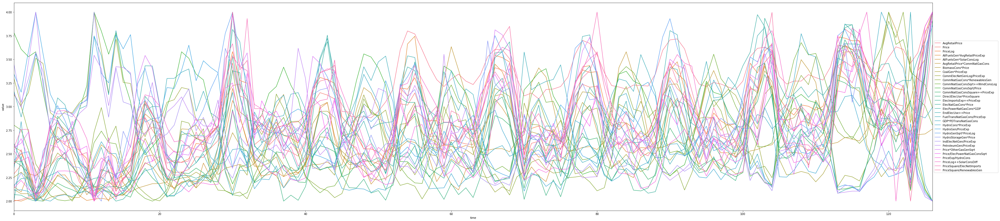

In [123]:
plt.close("all")
%run helper_functions.py 
signal_plot(flip_df(new_test_data))

### Sample transition to a "slid dataframe": past values of signals are made into regression features of price

In [460]:
new_test_data.head()

,ElecPowerNatGasCons,Price,PriceLog,DirectElecUse*PriceExp,ElecNetImports++Price,PriceExp/TotNatGasConsSquare
0,3.100413,3.114551,1.136085,57.245103,6.544049,2.504227
1,3.010341,3.160991,1.150885,60.049758,6.512692,1.937560
2,3.023409,3.247678,1.177940,71.407899,6.745247,1.757994
3,2.917011,3.027864,1.107857,58.340342,6.580538,1.644530
4,2.699706,3.179567,1.156745,60.069562,6.391884,2.912298


In [178]:
%run helper_functions.py 
sample_test_slid_df = slide_df(new_test_data, 1, 24, purpose='train')
sample_test_slid_df.head()

,Price,AvgRetailPrice-1,Price-1,PriceLog-1,AllFuelsGen*AvgRetailPriceExp-1,AllFuelsGen*SolarConsLog-1,AvgRetailPrice*CommNatGasCons-1,BiomassCons*Price-1,CoalGen*PriceExp-1,CommElecNetGenLog/PriceExp-1,...,HydroGenSqrt*PriceLog-24,HydroStorageGen*Price-24,IndElecNetGen/PriceExp-24,PetroleumGen/PriceExp-24,Price*OtherGasGenSqrt-24,Price/ElecPowerNatGasConsSqrt-24,PriceExp/HydroCons-24,PriceLog++SolarConsDiff-24,PriceSquare/ElecNetImports-24,PriceSquare/RenewablesGen-24
0,4.000000,3.853018,3.695839,1.307208,123.834068,3.642093,8.069017,14.101287,115.408836,0.030126,...,2.014992,10.202370,0.149306,0.089341,5.306137,1.599713,7.556180,1.199346,2.647197,3.610196
1,3.695839,3.569554,3.259684,1.181630,90.541040,3.463413,8.033472,12.405821,57.729387,0.044742,...,2.045893,10.690269,0.112540,0.086688,5.384445,1.780381,8.450781,1.173997,3.199382,3.631753
2,3.259684,3.459318,2.476327,0.906776,73.808980,2.995193,8.923624,9.129489,26.965713,0.092783,...,1.806292,9.578507,0.185557,0.133398,4.598637,1.542924,4.722247,0.984669,2.250939,2.624915
3,2.476327,3.606299,3.007174,1.101001,79.014939,2.660726,12.016365,11.450456,51.258235,0.056605,...,1.581754,8.405864,0.184702,0.174978,4.384017,1.524578,4.422958,0.824837,2.126491,2.782000
4,3.007174,3.632546,3.024390,1.106709,82.253835,2.345708,13.216849,10.262673,41.460170,0.055146,...,1.472459,8.384811,0.206700,0.155342,4.492537,1.541692,4.406178,0.858475,2.238448,2.692568


In [179]:
reg_heat_map(sample_test_slid_df)

### Add moving averages of all signals as features

In [27]:
# %run helper_functions.py 
# new_test_data_wma = df_add_moving_averages(new_test_data, window=12)
# new_test_data_wma.head()

### Train independent regression models for each month offset, sweeping over hyperparameters:
- look-back range
- test proportion
- regularization coefficient
- interpolation distribution shape 

### Still have to figure out how to select the best hyperparameters for each independent model. The hyperparameters that produce the best test error (using a random test/train split), which are currently plotted as 'best,' are not necessarily the ones that produce the best forecasts. The 'mean' of all hyperparameter combination predictions does pretty well.

One idea is to not to random test/train splitting, but use all recent data as test and data prior to that as train. Then selecting the best test-performing hyperparameters might be like selecting the best for forecasting.

Currently the cells are set up to sweep over and plot the results of different combinations of hyperparameters if the same combination is used for each model.

In [250]:
%run helper_functions.py 
plt.close("all")
full_df, best_df = train_hopping_lasso(new_test_data4, comp_var='Price', pred_len=36, iter=5,
                        interp_min=0, interp_max=10, interp_curves=[0,2,6],
                        look_back_min=18, look_back_max=24, look_back_step=3, look_back_override='single', 
                        test_props=list(np.linspace(.1,.3,3)),
                        alphas=list(np.linspace(.0005,.0015,3)),
                        model_type=Lasso)

In [228]:
full_df.head()

,,,,,len_data_mean,n_iter_mean,num_feats_mean,pred_mean,test_error_mean,test_num_mean,train_error_mean,train_num_mean,len_data_std,n_iter_std,...,train_num_std,kept_feats_sample,len_data_sample,n_iter_sample,num_feats_sample,pred_sample,test_error_sample,test_num_sample,train_error_sample,train_num_sample
offset,look_back,train_prop,neg_alpha,interp_curve,,,,,,,,,,,,,,,,,,,,,
1,18,0.9,-0.001,0,1189.0,166.1,14.6,3.867117,0.114004,119.0,0.109433,1070.0,0.0,13.436683,...,0.0,PriceMA-1+AllFuelsGen*SolarConsLog-1+HydroCons...,1189,176,14,3.851859,0.104676,119,0.109610,1070
1,18,0.9,-0.001,6,2595.0,209.8,12.1,3.880108,0.132075,260.0,0.129021,2335.0,0.0,5.940445,...,0.0,AllFuelsGen*SolarConsLog-1+RenCons-2+Renewable...,2595,216,12,3.891366,0.126491,260,0.129078,2335
2,18,0.9,-0.001,0,1178.0,162.0,12.9,3.799259,0.115522,118.0,0.110549,1060.0,0.0,21.102922,...,0.0,RenewablesGen-2+PriceMA-2+CommNatGasCons*Renew...,1178,139,13,3.810583,0.117006,118,0.109539,1060
2,18,0.9,-0.001,6,2571.0,155.0,11.1,3.782445,0.122918,258.0,0.128200,2313.0,0.0,9.510228,...,0.0,RenCons-2+RenewablesGen-2+CommNatGasCons*Renew...,2571,158,11,3.783311,0.119441,258,0.128740,2313
3,18,0.9,-0.001,0,1167.0,143.1,11.3,3.442413,0.110851,117.0,0.111518,1050.0,0.0,12.123897,...,0.0,RenewablesGen-3+PriceMA-3+CommNatGasCons*Renew...,1167,137,11,3.447660,0.106523,117,0.111074,1050


### Plot mean prediction path of all hyperparameter combinations

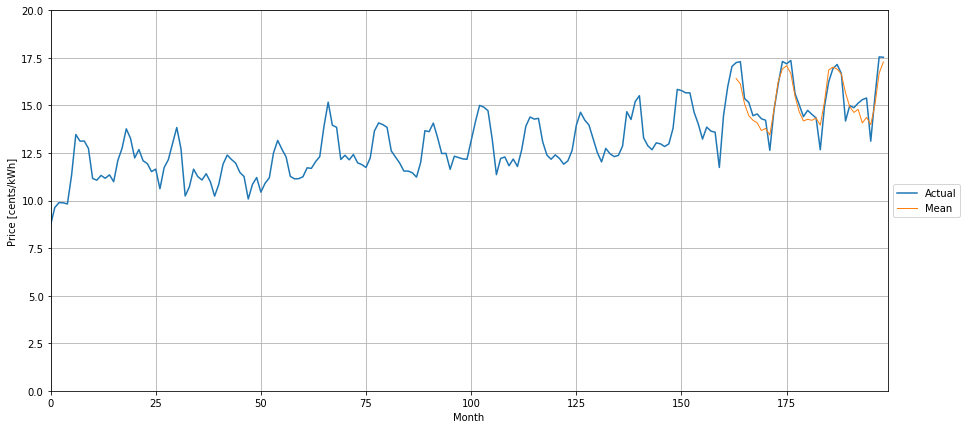

Mean RMSE: 0.626 cents


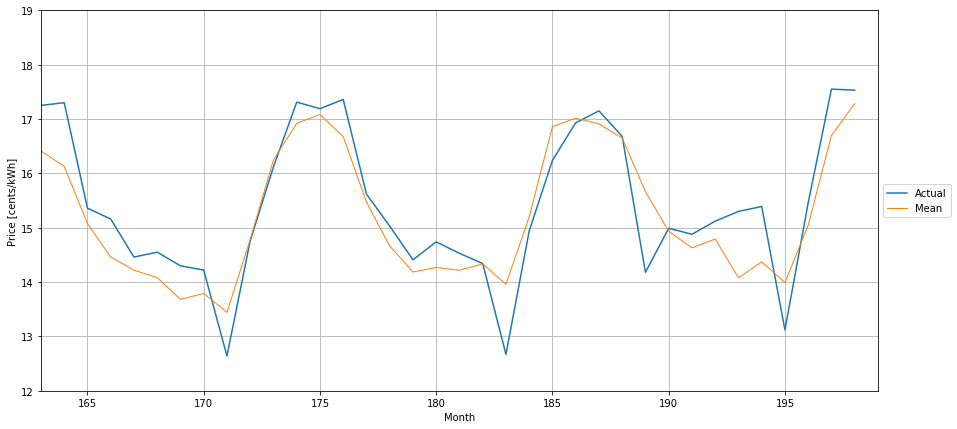

Mean RMSE: 0.626 cents


In [251]:
%run helper_functions.py 
preds_mean = test_rescaler1(full_df.groupby('offset').mean().pred_mean)
preds_list = [preds_mean]
labels = ['Mean']
pred_plot(raw_all_data, preds_list=preds_list, 
          start_back=start_back, pred_len=36,
          labels=labels, interp=False, linewidth=1)
pred_plot(raw_all_data, preds_list=preds_list,
          start_back=start_back, pred_len=36,
          labels=labels, interp=False,
          ylim=[12,19], x_zoom=True, linewidth=1)

### Plot prediction paths of all hyperparameter combinations

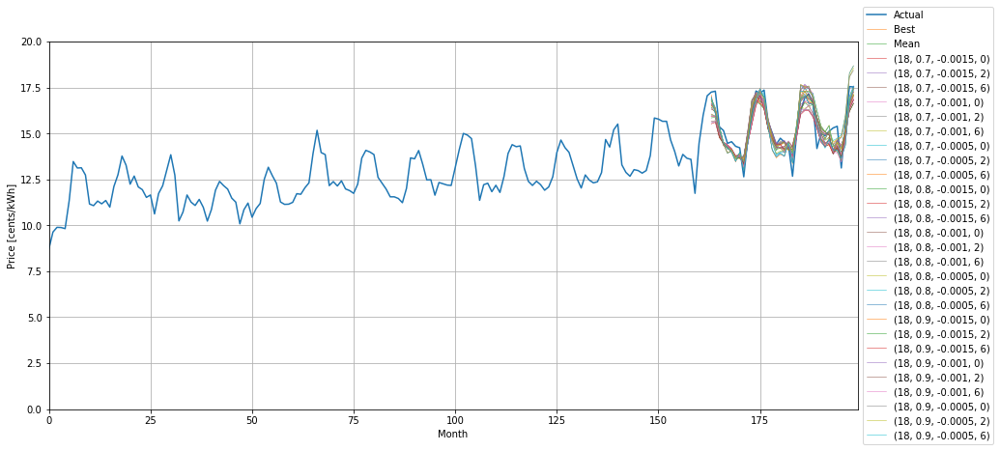

Best RMSE: 0.725 cents
Mean RMSE: 0.626 cents
(18, 0.7, -0.0015, 0) RMSE: 0.670 cents
(18, 0.7, -0.0015, 2) RMSE: 0.727 cents
(18, 0.7, -0.0015, 6) RMSE: 0.754 cents
(18, 0.7, -0.001, 0) RMSE: 0.686 cents
(18, 0.7, -0.001, 2) RMSE: 0.662 cents
(18, 0.7, -0.001, 6) RMSE: 0.692 cents
(18, 0.7, -0.0005, 0) RMSE: 0.719 cents
(18, 0.7, -0.0005, 2) RMSE: 0.675 cents
(18, 0.7, -0.0005, 6) RMSE: 0.657 cents
(18, 0.8, -0.0015, 0) RMSE: 0.682 cents
(18, 0.8, -0.0015, 2) RMSE: 0.746 cents
(18, 0.8, -0.0015, 6) RMSE: 0.766 cents
(18, 0.8, -0.001, 0) RMSE: 0.673 cents
(18, 0.8, -0.001, 2) RMSE: 0.684 cents
(18, 0.8, -0.001, 6) RMSE: 0.697 cents
(18, 0.8, -0.0005, 0) RMSE: 0.708 cents
(18, 0.8, -0.0005, 2) RMSE: 0.664 cents
(18, 0.8, -0.0005, 6) RMSE: 0.654 cents
(18, 0.9, -0.0015, 0) RMSE: 0.684 cents
(18, 0.9, -0.0015, 2) RMSE: 0.761 cents
(18, 0.9, -0.0015, 6) RMSE: 0.780 cents
(18, 0.9, -0.001, 0) RMSE: 0.667 cents
(18, 0.9, -0.001, 2) RMSE: 0.696 cents
(18, 0.9, -0.001, 6) RMSE: 0.715 cents
(18

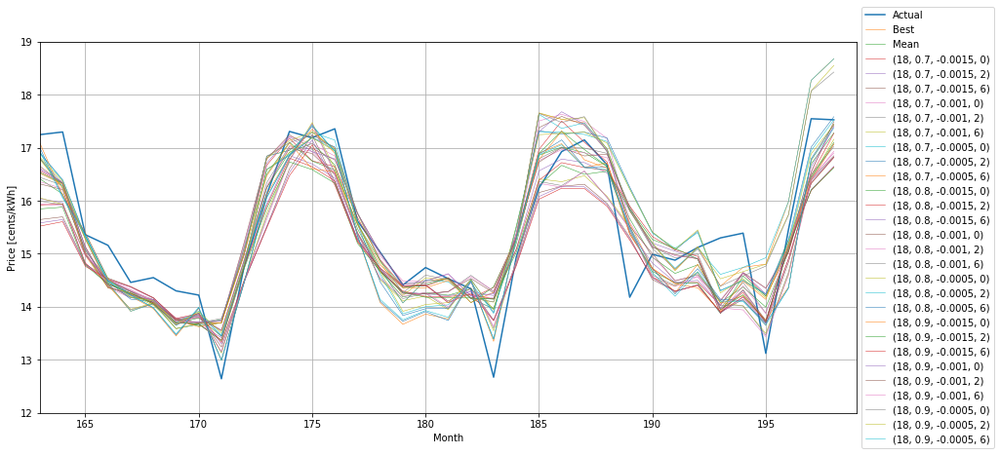

Best RMSE: 0.725 cents
Mean RMSE: 0.626 cents
(18, 0.7, -0.0015, 0) RMSE: 0.670 cents
(18, 0.7, -0.0015, 2) RMSE: 0.727 cents
(18, 0.7, -0.0015, 6) RMSE: 0.754 cents
(18, 0.7, -0.001, 0) RMSE: 0.686 cents
(18, 0.7, -0.001, 2) RMSE: 0.662 cents
(18, 0.7, -0.001, 6) RMSE: 0.692 cents
(18, 0.7, -0.0005, 0) RMSE: 0.719 cents
(18, 0.7, -0.0005, 2) RMSE: 0.675 cents
(18, 0.7, -0.0005, 6) RMSE: 0.657 cents
(18, 0.8, -0.0015, 0) RMSE: 0.682 cents
(18, 0.8, -0.0015, 2) RMSE: 0.746 cents
(18, 0.8, -0.0015, 6) RMSE: 0.766 cents
(18, 0.8, -0.001, 0) RMSE: 0.673 cents
(18, 0.8, -0.001, 2) RMSE: 0.684 cents
(18, 0.8, -0.001, 6) RMSE: 0.697 cents
(18, 0.8, -0.0005, 0) RMSE: 0.708 cents
(18, 0.8, -0.0005, 2) RMSE: 0.664 cents
(18, 0.8, -0.0005, 6) RMSE: 0.654 cents
(18, 0.9, -0.0015, 0) RMSE: 0.684 cents
(18, 0.9, -0.0015, 2) RMSE: 0.761 cents
(18, 0.9, -0.0015, 6) RMSE: 0.780 cents
(18, 0.9, -0.001, 0) RMSE: 0.667 cents
(18, 0.9, -0.001, 2) RMSE: 0.696 cents
(18, 0.9, -0.001, 6) RMSE: 0.715 cents
(18

In [252]:
%run helper_functions.py 
grouped_full_df = full_df.groupby(['offset','look_back','train_prop','neg_alpha','interp_curve'])\
    .mean().pred_mean.unstack(['look_back','train_prop','neg_alpha','interp_curve'])
grouped_full_df.columns = [str(num) for num in grouped_full_df.columns]
preds = test_rescaler1(best_df.pred_mean.values)
preds_mean = test_rescaler1(full_df.groupby('offset').mean().pred_mean)
preds_list = [preds,preds_mean]
labels = ['Best','Mean']
for label in list(grouped_full_df):
    preds_list.append(test_rescaler1(grouped_full_df[label]))
    labels.append(label)
# preds_max = test_rescaler1(best_df.pred_mean.values+best_df.pred_std.values)
# preds_min = test_rescaler1(best_df.pred_mean.values-best_df.pred_std.values)
pred_plot(raw_all_data, preds_list=preds_list, 
          start_back=start_back, pred_len=36,
          labels=labels, interp=False)
pred_plot(raw_all_data, preds_list=preds_list,
          start_back=start_back, pred_len=36,
          labels=labels, interp=False,
          ylim=[12,19], x_zoom=True)

### Print features used in each regression model

In [30]:
# print([df['alpha'].values[0] for df in training_dfs])
# plt.plot([df['alpha'].values[0] for df in training_dfs])
# plt.show()

### Analyze effects of individual on test error

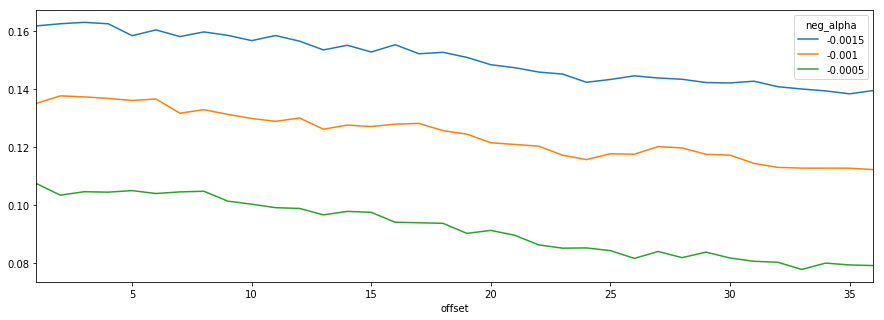

In [253]:
full_df.groupby(['offset','neg_alpha']).mean().test_error_mean.unstack('neg_alpha').plot(figsize=[15,5])
plt.show()

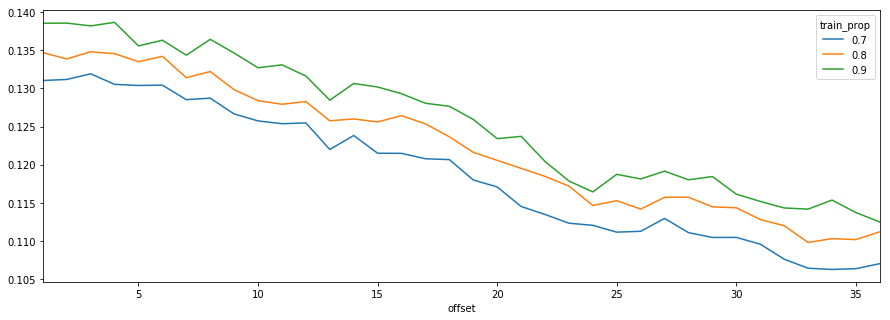

In [254]:
full_df.groupby(['offset','train_prop']).mean().test_error_mean.unstack('train_prop').plot(figsize=[15,5])
plt.show()

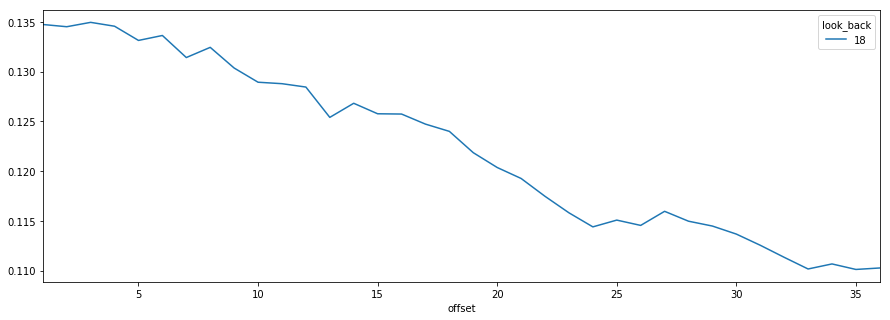

In [255]:
full_df.groupby(['offset','look_back']).mean().test_error_mean.unstack('look_back').plot(figsize=[15,5])
plt.show()

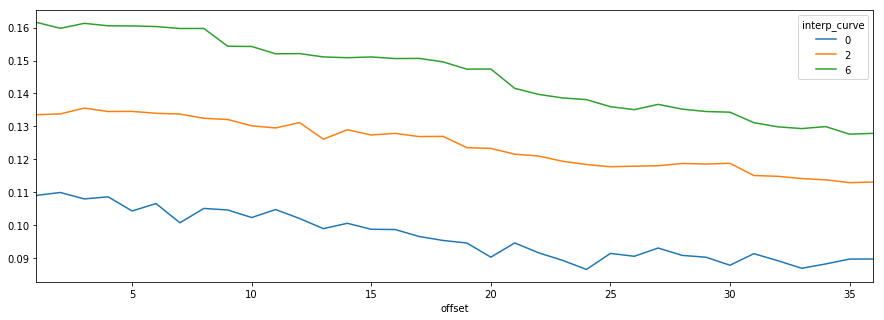

In [256]:
full_df.groupby(['offset','interp_curve']).mean().test_error_mean.unstack('interp_curve').plot(figsize=[15,5])
plt.show()

### Comparison of "all data" and "training data" rescalers

In [31]:
# x = np.linspace(0,5)
# plt.plot(x,all_rescaler(x),label='all_rescaler')
# plt.plot(x,test_rescaler1(x),label='test_rescaler')
# plt.legend()
# plt.show()

### Demonstrate weighted interpolation distribution

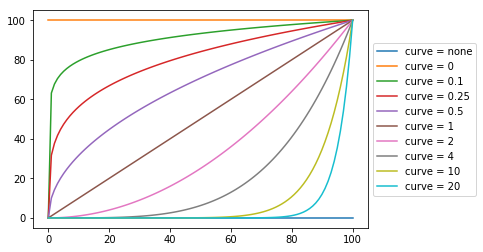

In [160]:
min, max = 0, 100
x = np.linspace(max,min,100)
curves = [0,.1,.25,.5,1,2,4,10,20]
for curve in curves:
    y = np.linspace(max,min,100)**curve/(max**(curve-1))
    if curve == 0:
        y2 = np.linspace(max,min,100)*0
        plt.plot(x,y2,label='curve = none')
    plt.plot(x,y,label='curve = '+str(curve))
plt.legend(loc='center left',bbox_to_anchor=(1, 0.5))
plt.show()

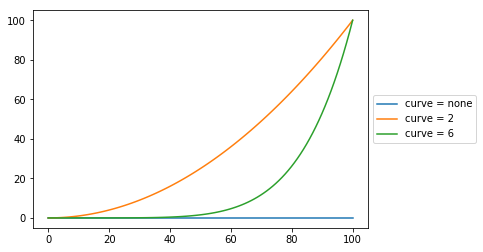

In [189]:
min, max = 0, 100
x = np.linspace(max,min,100)
curves = [2,6]
for curve in curves:
    y = np.linspace(max,min,100)**curve/(max**(curve-1))
    if curve == 2:
        y2 = np.linspace(max,min,100)*0
        plt.plot(x,y2,label='curve = none')
    plt.plot(x,y,label='curve = '+str(curve))
plt.legend(loc='center left',bbox_to_anchor=(1, 0.5))
plt.show()

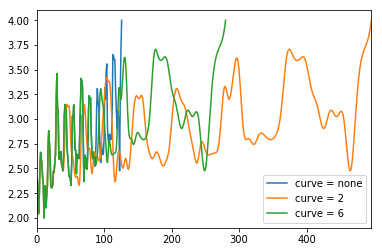

In [200]:
%run helper_functions.py
flip_df(new_test_data).Price.plot()
df_int1 = flip_df(df_interpolate(new_test_data,0,10,curve=2)).Price.plot()
df_int2 = flip_df(df_interpolate(new_test_data,0,10,curve=6)).Price.plot()
plt.legend(["curve = none",'curve = 2','curve = 6'])
plt.show()
# pd.Series.

In [171]:
df = new_test_data
new_test_data.head()

,AvgRetailPrice,Price,PriceLog,AllFuelsGen*AvgRetailPriceExp,AllFuelsGen*SolarConsLog,AvgRetailPrice*CommNatGasCons,BiomassCons*Price,CoalGen*PriceExp,CommElecNetGenLog/PriceExp,CommNatGasCons*RenewablesGen,...,HydroGenSqrt*PriceLog,HydroStorageGen*Price,IndElecNetGen/PriceExp,PetroleumGen/PriceExp,Price*OtherGasGenSqrt,Price/ElecPowerNatGasConsSqrt,PriceExp/HydroCons,PriceLog++SolarConsDiff,PriceSquare/ElecNetImports,PriceSquare/RenewablesGen
122,2.125984,2.223816,0.799225,20.337125,1.902890,4.749143,4.605406,30.480605,0.089443,5.506735,...,1.375731,7.017435,0.373069,0.249397,3.779586,1.424557,2.971759,0.792326,2.139353,2.006129
123,2.062992,2.043042,0.714440,18.581560,1.801799,5.340863,4.308924,19.361466,0.091897,5.868069,...,1.250679,4.446557,0.418110,0.384348,3.668109,1.381838,2.812255,0.668657,1.846402,1.841506
124,2.041995,2.258250,0.814590,18.900107,1.837636,6.226646,4.768303,35.361948,0.075724,6.878538,...,1.437017,5.163197,0.355149,0.292197,4.516499,1.540498,3.209560,0.785114,2.549846,2.260723
125,2.015748,2.381636,0.867787,16.564335,1.547495,7.222785,4.763271,40.425244,0.069734,7.694027,...,1.425695,5.890018,0.298953,0.209682,4.348693,1.626384,3.941148,0.768697,2.547433,2.641589
126,2.000000,2.286944,0.827216,17.365403,1.632683,7.424041,5.027789,36.660127,0.082550,8.067915,...,1.381792,5.172537,0.390876,0.235587,4.285290,1.573365,3.294067,0.814046,2.276486,2.406358


In [172]:
%run helper_functions.py
df_int = df_interpolate(new_test_data,0,2,1)
df_int.head()

,AvgRetailPrice,Price,PriceLog,AllFuelsGen*AvgRetailPriceExp,AllFuelsGen*SolarConsLog,AvgRetailPrice*CommNatGasCons,BiomassCons*Price,CoalGen*PriceExp,CommElecNetGenLog/PriceExp,CommNatGasCons*RenewablesGen,...,HydroGenSqrt*PriceLog,HydroStorageGen*Price,IndElecNetGen/PriceExp,PetroleumGen/PriceExp,Price*OtherGasGenSqrt,Price/ElecPowerNatGasConsSqrt,PriceExp/HydroCons,PriceLog++SolarConsDiff,PriceSquare/ElecNetImports,PriceSquare/RenewablesGen
187,2.125984,2.223816,0.799225,20.337125,1.902890,4.749143,4.605406,30.480605,0.089443,5.506735,...,1.375731,7.017435,0.373069,0.249397,3.779586,1.424557,2.971759,0.792326,2.139353,2.006129
188,2.062992,2.043042,0.714440,18.581560,1.801799,5.340863,4.308924,19.361466,0.091897,5.868069,...,1.250679,4.446557,0.418110,0.384348,3.668109,1.381838,2.812255,0.668657,1.846402,1.841506
189,2.041995,2.258250,0.814590,18.900107,1.837636,6.226646,4.768303,35.361948,0.075724,6.878538,...,1.437017,5.163197,0.355149,0.292197,4.516499,1.540498,3.209560,0.785114,2.549846,2.260723
190,2.015748,2.381636,0.867787,16.564335,1.547495,7.222785,4.763271,40.425244,0.069734,7.694027,...,1.425695,5.890018,0.298953,0.209682,4.348693,1.626384,3.941148,0.768697,2.547433,2.641589
191,2.000000,2.286944,0.827216,17.365403,1.632683,7.424041,5.027789,36.660127,0.082550,8.067915,...,1.381792,5.172537,0.390876,0.235587,4.285290,1.573365,3.294067,0.814046,2.276486,2.406358


### Create GIFs of heat maps

This will create files in your system, in folders called 'figs' and 'gifs'. There will be an error if these folders don't already exist in your directory.

In [182]:
%run helper_functions.py
len_gif = 24
months = 48
filenames = ['figs/offset'+str(i)+'.jpg' for i in range(len_gif)]
for g in range(1):
    for f in range(len_gif):
        df = slide_df(new_test_data,f,4)
        if g == 0: sort='single'
        else: sort=None
        time_heat_map(df, show=False, sort=sort, months=months, include_cbar=False)\
        .get_figure().savefig(filenames[f],bbox_inches='tight')
    import imageio
    images = []
    for filename in filenames:
        images.append(imageio.imread(filename))
    imageio.mimsave('gifs/gif'+str(g)+'.gif', images)